<a href="https://colab.research.google.com/github/pondyasha/wids_datathon_2023/blob/main/wids_datathon_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os 
os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [2]:
!kaggle competitions download -c widsdatathon2023

 99% 201M/203M [00:02<00:00, 105MB/s]
100% 203M/203M [00:02<00:00, 91.6MB/s]


In [3]:
!chmod 600 /content/kaggle.json

In [4]:
!unzip /content/widsdatathon2023.zip

Archive:  /content/widsdatathon2023.zip
  inflating: sample_solution.csv     
  inflating: test_data.csv           
  inflating: train_data.csv          


Import Libraries

In [53]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.colors
import plotly.express as px
import seaborn as sns

from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import FunctionTransformer

# Models
from sklearn.linear_model import LinearRegression # Linear regression
import lightgbm as lgb # Gradient Boosting Trees

import time

Load Data

In [6]:
train_df = pd.read_csv('/content/train_data.csv')
display(train_df.head().style.set_caption('Train data'))

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,nmme0-tmp2m-34w__gfdlflora0,nmme0-tmp2m-34w__gfdlflorb0,nmme0-tmp2m-34w__gfdl0,nmme0-tmp2m-34w__nasa0,nmme0-tmp2m-34w__nmme0mean,contest-wind-h10-14d__wind-hgt-10,nmme-tmp2m-56w__cancm3,nmme-tmp2m-56w__cancm4,nmme-tmp2m-56w__ccsm3,nmme-tmp2m-56w__ccsm4,nmme-tmp2m-56w__cfsv2,nmme-tmp2m-56w__gfdl,nmme-tmp2m-56w__gfdlflora,nmme-tmp2m-56w__gfdlflorb,nmme-tmp2m-56w__nasa,nmme-tmp2m-56w__nmmemean,contest-rhum-sig995-14d__rhum,nmme-prate-34w__cancm3,nmme-prate-34w__cancm4,nmme-prate-34w__ccsm3,nmme-prate-34w__ccsm4,nmme-prate-34w__cfsv2,nmme-prate-34w__gfdl,nmme-prate-34w__gfdlflora,nmme-prate-34w__gfdlflorb,nmme-prate-34w__nasa,nmme-prate-34w__nmmemean,contest-wind-h100-14d__wind-hgt-100,nmme0-prate-56w__cancm30,nmme0-prate-56w__cancm40,nmme0-prate-56w__ccsm30,nmme0-prate-56w__ccsm40,nmme0-prate-56w__cfsv20,nmme0-prate-56w__gfdlflora0,nmme0-prate-56w__gfdlflorb0,nmme0-prate-56w__gfdl0,nmme0-prate-56w__nasa0,nmme0-prate-56w__nmme0mean,nmme0-prate-34w__cancm30,nmme0-prate-34w__cancm40,nmme0-prate-34w__ccsm30,nmme0-prate-34w__ccsm40,nmme0-prate-34w__cfsv20,nmme0-prate-34w__gfdlflora0,nmme0-prate-34w__gfdlflorb0,nmme0-prate-34w__gfdl0,nmme0-prate-34w__nasa0,nmme0-prate-34w__nmme0mean,contest-tmp2m-14d__tmp2m,contest-slp-14d__slp,contest-wind-vwnd-925-14d__wind-vwnd-925,nmme-prate-56w__cancm3,nmme-prate-56w__cancm4,nmme-prate-56w__ccsm3,nmme-prate-56w__ccsm4,nmme-prate-56w__cfsv2,nmme-prate-56w__gfdl,nmme-prate-56w__gfdlflora,nmme-prate-56w__gfdlflorb,nmme-prate-56w__nasa,nmme-prate-56w__nmmemean,contest-pres-sfc-gauss-14d__pres,contest-wind-uwnd-250-14d__wind-uwnd-250,nmme-tmp2m-34w__cancm3,nmme-tmp2m-34w__cancm4,nmme-tmp2m-34w__ccsm3,nmme-tmp2m-34w__ccsm4,nmme-tmp2m-34w__cfsv2,nmme-tmp2m-34w__gfdl,nmme-tmp2m-34w__gfdlflora,nmme-tmp2m-34w__gfdlflorb,nmme-tmp2m-34w__nasa,nmme-tmp2m-34w__nmmemean,contest-prwtr-eatm-14d__prwtr,contest-wind-vwnd-250-14d__wind-vwnd-250,contest-precip-14d__precip,contest-wind-h850-14d__wind-hgt-850,contest-wind-uwnd-925-14d__wind-uwnd-925,contest-wind-h500-14d__wind-hgt-500,cancm30,cancm40,ccsm30,ccsm40,cfsv20,gfdlflora0,gfdlflorb0,gfdl0,nasa0,nmme0mean,climateregions__climateregion,elevation__elevation,wind-vwnd-250-2010-1,wind-vwnd-250-2010-2,wind-vwnd-250-2010-3,wind-vwnd-250-2010-4,wind-vwnd-250-2010-5,wind-vwnd-250-2010-6,wind-vwnd-250-2010-7,wind-vwnd-250-2010-8,wind-vwnd-250-2010-9,wind-vwnd-250-2010-10,wind-vwnd-250-2010-11,wind-vwnd-250-2010-12,wind-vwnd-250-2010-13,wind-vwnd-250-2010-14,wind-vwnd-250-2010-15,wind-vwnd-250-2010-16,wind-vwnd-250-2010-17,wind-vwnd-250-2010-18,wind-vwnd-250-2010-19,wind-vwnd-250-2010-20,wind-uwnd-250-2010-1,wind-uwnd-250-2010-2,wind-uwnd-250-2010-3,wind-uwnd-250-2010-4,wind-uwnd-250-2010-5,wind-uwnd-250-2010-6,wind-uwnd-250-2010-7,wind-uwnd-250-2010-8,wind-uwnd-250-2010-9,wind-uwnd-250-2010-10,wind-uwnd-250-2010-11,wind-uwnd-250-2010-12,wind-uwnd-250-2010-13,wind-uwnd-250-2010-14,wind-uwnd-250-2010-15,wind-uwnd-250-2010-16,wind-uwnd-250-2010-17,wind-uwnd-250-2010-18,wind-uwnd-250-2010-19,wind-uwnd-250-2010-20,mjo1d__phase,mjo1d__amplitude,mei__mei,mei__meirank,mei__nip,wind-hgt-850-2010-1,wind-hgt-850-2010-2,wind-hgt-850-2010-3,wind-hgt-850-2010-4,wind-hgt-850-2010-5,wind-hgt-850-2010-6,wind-hgt-850-2010-7,wind-hgt-850-2010-8,wind-hgt-850-2010-9,wind-hgt-850-2010-10,sst-2010-1,sst-2010-2,sst-2010-3,sst-2010-4,sst-2010-5,sst-2010-6,sst-2010-7,sst-2010-8,sst-2010-9,sst-2010-10,wind-hgt-500-2010-1,wind-hgt-500-2010-2,wind-hgt-500-2010-3,wind-hgt-500-2010-4,wind-hgt-500-2010-5,wind-hgt-500-2010-6,wind-hgt-500-2010-7,wind-hgt-500-2010-8,wind-hgt-500-2010-9,wind-hgt-500-2010-10,icec-2010-1,icec-2010-2,icec-2010-3,icec-2010-4,icec-2010-5,icec-2010-6,icec-2010-7,icec-2010-8,icec-2010-9,icec-2010-10,wind-uwnd-925-2010-1,wind-uwnd-925-2010-2,wind-uwnd-925-2010-3,wind-uwnd-925-2010-4,wind-uwnd-925-2010

In [7]:
test_df = pd.read_csv('/content/test_data.csv')
display(test_df.head().style.set_caption('Test data'))

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,nmme0-tmp2m-34w__gfdlflora0,nmme0-tmp2m-34w__gfdlflorb0,nmme0-tmp2m-34w__gfdl0,nmme0-tmp2m-34w__nasa0,nmme0-tmp2m-34w__nmme0mean,contest-wind-h10-14d__wind-hgt-10,nmme-tmp2m-56w__cancm3,nmme-tmp2m-56w__cancm4,nmme-tmp2m-56w__ccsm3,nmme-tmp2m-56w__ccsm4,nmme-tmp2m-56w__cfsv2,nmme-tmp2m-56w__gfdl,nmme-tmp2m-56w__gfdlflora,nmme-tmp2m-56w__gfdlflorb,nmme-tmp2m-56w__nasa,nmme-tmp2m-56w__nmmemean,contest-rhum-sig995-14d__rhum,nmme-prate-34w__cancm3,nmme-prate-34w__cancm4,nmme-prate-34w__ccsm3,nmme-prate-34w__ccsm4,nmme-prate-34w__cfsv2,nmme-prate-34w__gfdl,nmme-prate-34w__gfdlflora,nmme-prate-34w__gfdlflorb,nmme-prate-34w__nasa,nmme-prate-34w__nmmemean,contest-wind-h100-14d__wind-hgt-100,nmme0-prate-56w__cancm30,nmme0-prate-56w__cancm40,nmme0-prate-56w__ccsm30,nmme0-prate-56w__ccsm40,nmme0-prate-56w__cfsv20,nmme0-prate-56w__gfdlflora0,nmme0-prate-56w__gfdlflorb0,nmme0-prate-56w__gfdl0,nmme0-prate-56w__nasa0,nmme0-prate-56w__nmme0mean,nmme0-prate-34w__cancm30,nmme0-prate-34w__cancm40,nmme0-prate-34w__ccsm30,nmme0-prate-34w__ccsm40,nmme0-prate-34w__cfsv20,nmme0-prate-34w__gfdlflora0,nmme0-prate-34w__gfdlflorb0,nmme0-prate-34w__gfdl0,nmme0-prate-34w__nasa0,nmme0-prate-34w__nmme0mean,contest-slp-14d__slp,contest-wind-vwnd-925-14d__wind-vwnd-925,nmme-prate-56w__cancm3,nmme-prate-56w__cancm4,nmme-prate-56w__ccsm3,nmme-prate-56w__ccsm4,nmme-prate-56w__cfsv2,nmme-prate-56w__gfdl,nmme-prate-56w__gfdlflora,nmme-prate-56w__gfdlflorb,nmme-prate-56w__nasa,nmme-prate-56w__nmmemean,contest-pres-sfc-gauss-14d__pres,contest-wind-uwnd-250-14d__wind-uwnd-250,nmme-tmp2m-34w__cancm3,nmme-tmp2m-34w__cancm4,nmme-tmp2m-34w__ccsm3,nmme-tmp2m-34w__ccsm4,nmme-tmp2m-34w__cfsv2,nmme-tmp2m-34w__gfdl,nmme-tmp2m-34w__gfdlflora,nmme-tmp2m-34w__gfdlflorb,nmme-tmp2m-34w__nasa,nmme-tmp2m-34w__nmmemean,contest-prwtr-eatm-14d__prwtr,contest-wind-vwnd-250-14d__wind-vwnd-250,contest-precip-14d__precip,contest-wind-h850-14d__wind-hgt-850,contest-wind-uwnd-925-14d__wind-uwnd-925,contest-wind-h500-14d__wind-hgt-500,cancm30,cancm40,ccsm30,ccsm40,cfsv20,gfdlflora0,gfdlflorb0,gfdl0,nasa0,nmme0mean,climateregions__climateregion,elevation__elevation,wind-vwnd-250-2010-1,wind-vwnd-250-2010-2,wind-vwnd-250-2010-3,wind-vwnd-250-2010-4,wind-vwnd-250-2010-5,wind-vwnd-250-2010-6,wind-vwnd-250-2010-7,wind-vwnd-250-2010-8,wind-vwnd-250-2010-9,wind-vwnd-250-2010-10,wind-vwnd-250-2010-11,wind-vwnd-250-2010-12,wind-vwnd-250-2010-13,wind-vwnd-250-2010-14,wind-vwnd-250-2010-15,wind-vwnd-250-2010-16,wind-vwnd-250-2010-17,wind-vwnd-250-2010-18,wind-vwnd-250-2010-19,wind-vwnd-250-2010-20,wind-uwnd-250-2010-1,wind-uwnd-250-2010-2,wind-uwnd-250-2010-3,wind-uwnd-250-2010-4,wind-uwnd-250-2010-5,wind-uwnd-250-2010-6,wind-uwnd-250-2010-7,wind-uwnd-250-2010-8,wind-uwnd-250-2010-9,wind-uwnd-250-2010-10,wind-uwnd-250-2010-11,wind-uwnd-250-2010-12,wind-uwnd-250-2010-13,wind-uwnd-250-2010-14,wind-uwnd-250-2010-15,wind-uwnd-250-2010-16,wind-uwnd-250-2010-17,wind-uwnd-250-2010-18,wind-uwnd-250-2010-19,wind-uwnd-250-2010-20,mjo1d__phase,mjo1d__amplitude,mei__mei,mei__meirank,mei__nip,wind-hgt-850-2010-1,wind-hgt-850-2010-2,wind-hgt-850-2010-3,wind-hgt-850-2010-4,wind-hgt-850-2010-5,wind-hgt-850-2010-6,wind-hgt-850-2010-7,wind-hgt-850-2010-8,wind-hgt-850-2010-9,wind-hgt-850-2010-10,sst-2010-1,sst-2010-2,sst-2010-3,sst-2010-4,sst-2010-5,sst-2010-6,sst-2010-7,sst-2010-8,sst-2010-9,sst-2010-10,wind-hgt-500-2010-1,wind-hgt-500-2010-2,wind-hgt-500-2010-3,wind-hgt-500-2010-4,wind-hgt-500-2010-5,wind-hgt-500-2010-6,wind-hgt-500-2010-7,wind-hgt-500-2010-8,wind-hgt-500-2010-9,wind-hgt-500-2010-10,icec-2010-1,icec-2010-2,icec-2010-3,icec-2010-4,icec-2010-5,icec-2010-6,icec-2010-7,icec-2010-8,icec-2010-9,icec-2010-10,wind-uwnd-925-2010-1,wind-uwnd-925-2010-2,wind-uwnd-925-2010-3,wind-uwnd-925-2010-4,wind-uwnd-925-2010-5,wind-uwnd-925-2010-6,w

In [8]:
train_df.columns

Index(['index', 'lat', 'lon', 'startdate',
       'contest-pevpr-sfc-gauss-14d__pevpr', 'nmme0-tmp2m-34w__cancm30',
       'nmme0-tmp2m-34w__cancm40', 'nmme0-tmp2m-34w__ccsm30',
       'nmme0-tmp2m-34w__ccsm40', 'nmme0-tmp2m-34w__cfsv20',
       ...
       'wind-vwnd-925-2010-11', 'wind-vwnd-925-2010-12',
       'wind-vwnd-925-2010-13', 'wind-vwnd-925-2010-14',
       'wind-vwnd-925-2010-15', 'wind-vwnd-925-2010-16',
       'wind-vwnd-925-2010-17', 'wind-vwnd-925-2010-18',
       'wind-vwnd-925-2010-19', 'wind-vwnd-925-2010-20'],
      dtype='object', length=246)

In [9]:
train_df.shape

(375734, 246)

In [10]:
test_df.shape

(31354, 245)

In [11]:
#check the time range 

train_df.startdate = pd.to_datetime(train_df.startdate)
test_df.startdate = pd.to_datetime(test_df.startdate)

In [12]:
print("Min startdate - train_df:", train_df.startdate.min())
print("Max startdate - test_df:", train_df.startdate.max())

print("Min startdate - test-df:", test_df.startdate.min())
print("Max startdate - test-df:", test_df.startdate.max())


Min startdate - train_df: 2014-09-01 00:00:00
Max startdate - test_df: 2016-08-31 00:00:00
Min startdate - test-df: 2022-11-01 00:00:00
Max startdate - test-df: 2022-12-31 00:00:00


In [13]:
#datatypes

train_df.dtypes

index                                          int64
lat                                          float64
lon                                          float64
startdate                             datetime64[ns]
contest-pevpr-sfc-gauss-14d__pevpr           float64
                                           ...      
wind-vwnd-925-2010-16                        float64
wind-vwnd-925-2010-17                        float64
wind-vwnd-925-2010-18                        float64
wind-vwnd-925-2010-19                        float64
wind-vwnd-925-2010-20                        float64
Length: 246, dtype: object

In [14]:
#look for missing values

print(train_df.isnull().values.any()) #train_df has missing values 

True


In [15]:
print(test_df.isnull().values.any())

False


In [16]:
#get the columns with null values
variables_with_null_values = train_df.columns[train_df.isna().any()]
print(variables_with_null_values)

Index(['nmme0-tmp2m-34w__ccsm30', 'nmme-tmp2m-56w__ccsm3',
       'nmme-prate-34w__ccsm3', 'nmme0-prate-56w__ccsm30',
       'nmme0-prate-34w__ccsm30', 'nmme-prate-56w__ccsm3',
       'nmme-tmp2m-34w__ccsm3', 'ccsm30'],
      dtype='object')


In [17]:
def get_count_nulls():
    columns = ['column_name','percentage']
    missing_values = []
    for i in variables_with_null_values:
        missing_values.append([i,round(train_df[i].isnull().sum()*100/len(train_df),2)])
    missing_values_df = pd.DataFrame(missing_values, columns = columns)
    return missing_values_df
        #print('percentage of nulls in:' + i, train_df[i].isna().sum()*100/len(train_df))

print(get_count_nulls())

               column_name  percentage
0  nmme0-tmp2m-34w__ccsm30        4.24
1    nmme-tmp2m-56w__ccsm3        2.74
2    nmme-prate-34w__ccsm3        2.33
3  nmme0-prate-56w__ccsm30        4.24
4  nmme0-prate-34w__ccsm30        4.24
5    nmme-prate-56w__ccsm3        2.74
6    nmme-tmp2m-34w__ccsm3        2.33
7                   ccsm30        4.24


In [18]:
#since the percentage of nulls are minimal, we can simply drop these rows

train_df = train_df.dropna()

In [19]:
train_df.shape

(352604, 246)

In [20]:
test_df.head()

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,...,wind-vwnd-925-2010-11,wind-vwnd-925-2010-12,wind-vwnd-925-2010-13,wind-vwnd-925-2010-14,wind-vwnd-925-2010-15,wind-vwnd-925-2010-16,wind-vwnd-925-2010-17,wind-vwnd-925-2010-18,wind-vwnd-925-2010-19,wind-vwnd-925-2010-20
0,375734,0.0,0.833333,2022-11-01,339.88,30.88,30.92,29.17,31.02,29.47,...,-19.28,-39.77,-29.25,40.88,-8.31,14.91,-24.62,31.05,-23.69,6.27
1,375735,0.0,0.833333,2022-11-02,334.63,30.88,30.92,29.17,31.02,29.47,...,-19.58,-43.14,-28.62,45.37,-5.42,16.97,-23.94,28.84,-20.61,14.16
2,375736,0.0,0.833333,2022-11-03,337.83,30.88,30.92,29.17,31.02,29.47,...,-13.73,-44.22,-27.67,49.76,-1.31,21.44,-19.06,26.85,-16.78,13.42
3,375737,0.0,0.833333,2022-11-04,345.81,30.88,30.92,29.17,31.02,29.47,...,-7.97,-49.47,-19.32,52.62,-0.44,21.65,-23.12,23.70,-18.62,10.69
4,375738,0.0,0.833333,2022-11-05,357.39,30.88,30.92,29.17,31.02,29.47,...,-0.80,-56.07,-9.89,51.23,-7.57,19.86,-30.56,20.66,-25.08,19.64


In [21]:
# there are different locations in train and test datasets - Let's solve this problem 

# count the unique locations

train_df[['startdate','climateregions__climateregion']]

,startdate,climateregions__climateregion
0,2014-09-01,BSh
1,2014-09-02,BSh
2,2014-09-03,BSh
3,2014-09-04,BSh
4,2014-09-05,BSh
...,...,...
375729,2016-08-27,Dfb
375730,2016-08-28,Dfb
375731,2016-08-29,Dfb
375732,2016-08-30,Dfb


In [22]:
train_df.groupby('startdate')['climateregions__climateregion'].count()

startdate
2014-09-01    514
2014-09-02    514
2014-09-03    514
2014-09-04    514
2014-09-05    514
             ... 
2016-08-27    514
2016-08-28    514
2016-08-29    514
2016-08-30    514
2016-08-31    514
Name: climateregions__climateregion, Length: 686, dtype: int64

In [23]:
test_df.groupby('startdate')['climateregions__climateregion'].count()

startdate
2022-11-01    514
2022-11-02    514
2022-11-03    514
2022-11-04    514
2022-11-05    514
             ... 
2022-12-27    514
2022-12-28    514
2022-12-29    514
2022-12-30    514
2022-12-31    514
Name: climateregions__climateregion, Length: 61, dtype: int64

In [24]:
all_df = pd.concat([train_df,test_df], axis = 0)

In [25]:
all_df['location_group'] = all_df.groupby(['lat','lon']).ngroup()

In [26]:
print(f'{all_df.location_group.nunique()} unique locations')

575 unique locations


In [27]:
# split back up

train_df = all_df.iloc[:len(train_df)]
test_df = all_df.iloc[len(train_df):]

In [28]:
# extract the different locations in train and test set 

print('Locations in train set not in test set')

location_train = list(train_df['location_group'].unique())
location_test = list(test_df.location_group.unique())

result_1 = list(set(location_train).difference(location_test))
print(result_1)

print('Locations in test set not in train set')

result_2 = list(set(location_test).difference(location_train))
print(result_2)

Locations in train set not in test set
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 76, 101, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 181, 210, 239, 269, 300, 330, 360, 389, 418, 447, 475, 504, 533, 559]
Locations in test set not in train set
[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 75, 100, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 180, 209, 238, 268, 299, 329, 359, 388, 417, 446, 474, 503, 532, 558]


In [29]:
#if we see lat and lon in these locations , there is a slight difference in that 16th digit after the decimal 

# we correct this by taking just 14 digits in both datasets

train_df.loc[train_df['location_group'] == 269]

print('train_location:', train_df.loc[159358].location_group)
print(train_df.loc[159358].lat,train_df.loc[159358].lon)

print('test_location:', test_df.loc[13298].location_group)
print(test_df.loc[13298].lat, test_df.loc[13298].lon)

train_location: 269
0.5454545454545454 0.3666666666666666
test_location: 268
0.5454545454545454 0.3666666666666665


In [30]:
test_df.loc[test_df['location_group'] == 268]

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,...,wind-vwnd-925-2010-12,wind-vwnd-925-2010-13,wind-vwnd-925-2010-14,wind-vwnd-925-2010-15,wind-vwnd-925-2010-16,wind-vwnd-925-2010-17,wind-vwnd-925-2010-18,wind-vwnd-925-2010-19,wind-vwnd-925-2010-20,location_group
13298,389032,0.545455,0.366667,2022-11-01,551.73,24.87,25.44,23.2,24.81,23.51,...,-39.77,-29.25,40.88,-8.31,14.91,-24.62,31.05,-23.69,6.27,268
13299,389033,0.545455,0.366667,2022-11-02,540.27,24.87,25.44,23.2,24.81,23.51,...,-43.14,-28.62,45.37,-5.42,16.97,-23.94,28.84,-20.61,14.16,268
13300,389034,0.545455,0.366667,2022-11-03,530.79,24.87,25.44,23.2,24.81,23.51,...,-44.22,-27.67,49.76,-1.31,21.44,-19.06,26.85,-16.78,13.42,268
13301,389035,0.545455,0.366667,2022-11-04,502.76,24.87,25.44,23.2,24.81,23.51,...,-49.47,-19.32,52.62,-0.44,21.65,-23.12,23.70,-18.62,10.69,268
13302,389036,0.545455,0.366667,2022-11-05,482.31,24.87,25.44,23.2,24.81,23.51,...,-56.07,-9.89,51.23,-7.57,19.86,-30.56,20.66,-25.08,19.64,268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13354,389088,0.545455,0.366667,2022-12-27,255.73,6.42,8.11,7.0,11.25,11.00,...,-8.49,32.39,38.82,7.42,11.75,-23.62,-0.24,-5.94,51.23,268
13355,389089,0.545455,0.366667,2022-12-28,238.83,6.42,8.11,7.0,11.25,11.00,...,0.83,26.23,37.64,13.01,17.84,-22.05,-3.03,1.31,51.45,268
13356,389090,0.545455,0.366667,2022-12-29,212.42,6.42,8.11,7.0,11.25,11.00,...,10.90,21.06,36.53,14.15,23.12,-25.60,-5.88,9.32,45.32,268
13357,389091,0.545455,0.366667,2022-12-30,197.48,6.42,8.11,7.0,11.25,11.00,...,21.37,20.42,36.05,6.38,29.00,-27.06,-1.42,16.06,31.88,268


In [31]:
scale = 14

train_df.loc[:,'lat'] = round(train_df.lat,scale)
train_df.loc[:,'lon'] = round(train_df.lon,scale)

test_df.loc[:,'lat'] = round(test_df.lat,scale)
test_df.loc[:,'lon'] = round(test_df.lon,scale)

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [32]:
#testing if the above steps worked

train_df = train_df.drop(['location_group'], axis = 1)


In [33]:
test_df = test_df.drop(['location_group'], axis = 1)

In [34]:
all_df = pd.concat([train_df,test_df], axis = 0)
all_df['new_location_group'] = all_df.groupby(['lat','lon']).ngroup()

In [35]:
all_df.head()

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,...,wind-vwnd-925-2010-12,wind-vwnd-925-2010-13,wind-vwnd-925-2010-14,wind-vwnd-925-2010-15,wind-vwnd-925-2010-16,wind-vwnd-925-2010-17,wind-vwnd-925-2010-18,wind-vwnd-925-2010-19,wind-vwnd-925-2010-20,new_location_group
0,0,0.0,0.833333,2014-09-01,237.00,29.02,31.64,29.57,30.73,29.71,...,-37.21,8.32,9.56,-2.03,48.13,28.09,-13.50,11.90,4.58,0
1,1,0.0,0.833333,2014-09-02,228.90,29.02,31.64,29.57,30.73,29.71,...,-36.57,8.77,21.17,4.44,48.60,27.41,-23.77,15.44,3.42,0
2,2,0.0,0.833333,2014-09-03,220.69,29.02,31.64,29.57,30.73,29.71,...,-34.16,6.99,32.16,5.01,48.53,19.21,-33.16,15.11,4.82,0
3,3,0.0,0.833333,2014-09-04,225.28,29.02,31.64,29.57,30.73,29.71,...,-31.04,6.17,39.66,-1.41,50.59,8.29,-37.22,18.24,9.74,0
4,4,0.0,0.833333,2014-09-05,237.24,29.02,31.64,29.57,30.73,29.71,...,-31.80,7.47,38.62,-5.21,54.73,-2.58,-42.30,21.91,10.95,0


In [36]:
print(all_df.new_location_group.nunique())

514


In [37]:
#split back up

train_df = all_df.iloc[:len(train_df)]
test_df = all_df.iloc[len(train_df):]



In [38]:
loc_train = list(train_df.new_location_group.unique())
loc_test = list(test_df.new_location_group.unique())
res = list(set(loc_train).difference(loc_test))
print(res)

[]


Climate Regions

In [43]:
train_df.climateregions__climateregion.value_counts().to_frame()

,climateregions__climateregion
BSk,131026
Dfb,49392
Cfa,48706
Csb,38416
Dfa,21266
BWk,13034
Dfc,11662
BWh,8918
Csa,8918
Dsb,7546


In which:

BSh: Hot semi-arid climate

BSk: Cold semi-arid climate

BWh: Hot desert climate

BWk: Cold desert climate

Cfa: Humid subtropical climate

Cfb: Temperate oceanic climate or subtropical highland climate

Csa: Hot-summer Mediterranean climate

Csb: Warm-summer Mediterranean climate

Dfa: Hot-summer humid continental climate

Dfb: Warm-summer humid continental climate

Dfc: Subarctic climate

Dsb: Mediterranean-influenced warm-summer humid continental climate

Dsc: Mediterranean-influenced subarctic climate

Dwa: Monsoon-influenced hot-summer humid continental climate

Dwb: Monsoon-influenced warm-summer humid continental climate

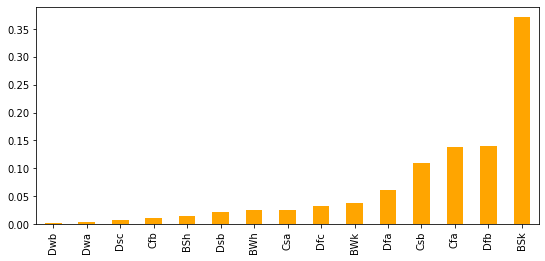

In [49]:
train_df['climateregions__climateregion'].value_counts(normalize = True).sort_values().plot(kind = 'bar'
,color = 'orange', figsize=(9,4))

In [55]:
fig = px.line(train_df, x='startdate',y='contest-tmp2m-14d__tmp2m',
              color = 'climateregions__climateregion',
              facet_row='climateregions__climateregion',
              facet_row_spacing=0.04,
              labels = {'contest-tmp2m-14d__tmp2m':'temp',
                        'climateregions__climateregion':'region'},
              template='plotly_white', width=1000, height = 1300,
              title = 'Mean temperature variations by climate regions')

fig.show()

